In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
data = pd.read_csv('movies.csv')
print(data.shape)
data.head()

(3000, 23)


,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,release_date,runtime,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue
0,1,"[{'id': 313576, 'name': 'Hot Tub Time Machine ...",14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,2/20/15,93.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651
1,2,"[{'id': 107674, 'name': 'The Princess Diaries ...",40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,8/6/04,113.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435
2,3,NaN,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,10/10/14,105.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000
3,4,NaN,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,3/9/12,122.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000
4,5,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,2/5/09,118.0,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970


In [4]:
print("\nData Types and Missing Values:")
data.info()


Data Types and Missing Values:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     3000 non-null   int64  
 1   belongs_to_collection  604 non-null    object 
 2   budget                 3000 non-null   int64  
 3   genres                 2993 non-null   object 
 4   homepage               946 non-null    object 
 5   imdb_id                3000 non-null   object 
 6   original_language      3000 non-null   object 
 7   original_title         3000 non-null   object 
 8   overview               2992 non-null   object 
 9   popularity             3000 non-null   float64
 10  poster_path            2999 non-null   object 
 11  production_companies   2844 non-null   object 
 12  production_countries   2945 non-null   object 
 13  release_date           3000 non-null   object 
 14  runtime                2

In [5]:
print("\nMissing Values in Each Column:")
data.isnull().sum()


Missing Values in Each Column:


id                          0
belongs_to_collection    2396
budget                      0
genres                      7
homepage                 2054
imdb_id                     0
original_language           0
original_title              0
overview                    8
popularity                  0
poster_path                 1
production_companies      156
production_countries       55
release_date                0
runtime                     2
spoken_languages           20
status                      0
tagline                   597
title                       0
Keywords                  276
cast                       13
crew                       16
revenue                     0
dtype: int64

In [6]:
print("\nSummary:")
data.describe()


Summary:


,id,budget,popularity,runtime,revenue
count,3000.000000,3.000000e+03,3000.000000,2998.000000,3.000000e+03
mean,1500.500000,2.253133e+07,8.463274,107.856571,6.672585e+07
std,866.169729,3.702609e+07,12.104000,22.086434,1.375323e+08
min,1.000000,0.000000e+00,0.000001,0.000000,1.000000e+00
25%,750.750000,0.000000e+00,4.018053,94.000000,2.379808e+06
50%,1500.500000,8.000000e+06,7.374861,104.000000,1.680707e+07
75%,2250.250000,2.900000e+07,10.890983,118.000000,6.891920e+07
max,3000.000000,3.800000e+08,294.337037,338.000000,1.519558e+09


In [7]:
data['revenue_class'] = 0
quantile = data['revenue'].quantile([0.2, 0.4, 0.6, 0.8])
for i in data.index:
    if data['revenue'][i] < quantile[0.2]:
        data['revenue_class'][i] = 'very low'
    elif data['revenue'][i] < quantile[0.4]:
        data['revenue_class'][i] = 'low'
    elif data['revenue'][i] < quantile[0.6]:
        data['revenue_class'][i] = 'medium'
    elif data['revenue'][i] < quantile[0.8]:
        data['revenue_class'][i] = 'high'
    else:
        data['revenue_class'][i] = 'very high'
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\2509995415.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['revenue_class'][i] = 'medium'


,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,runtime,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue,revenue_class
0,1,"[{'id': 313576, 'name': 'Hot Tub Time Machine ...",14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,93.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,medium
1,2,"[{'id': 107674, 'name': 'The Princess Diaries ...",40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,113.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,very high
2,3,NaN,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,105.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,medium
3,4,NaN,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,122.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,medium
4,5,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,118.0,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,low


In [8]:
custom_order = ['very low', 'low', 'medium', 'high', 'very high']
label_mapping = {label: i for i, label in enumerate(custom_order)}
data['revenue_class'] = data['revenue_class'].map(label_mapping)
data.head()

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,runtime,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue,revenue_class
0,1,"[{'id': 313576, 'name': 'Hot Tub Time Machine ...",14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,93.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2
1,2,"[{'id': 107674, 'name': 'The Princess Diaries ...",40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,113.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4
2,3,NaN,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,105.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2
3,4,NaN,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,122.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2
4,5,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,118.0,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1


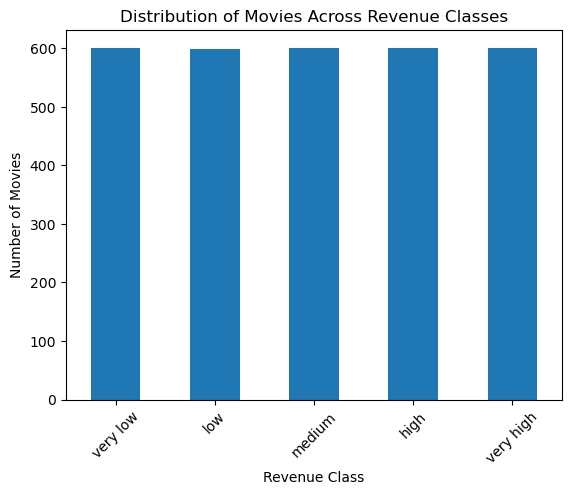

In [9]:
revenue_class_counts = data['revenue_class'].value_counts().sort_index()
revenue_class_counts.index = custom_order  # Use the custom order for labels

revenue_class_counts.plot(kind='bar')
plt.xlabel('Revenue Class')
plt.ylabel('Number of Movies')
plt.title('Distribution of Movies Across Revenue Classes')
plt.xticks(rotation=45)
plt.show()

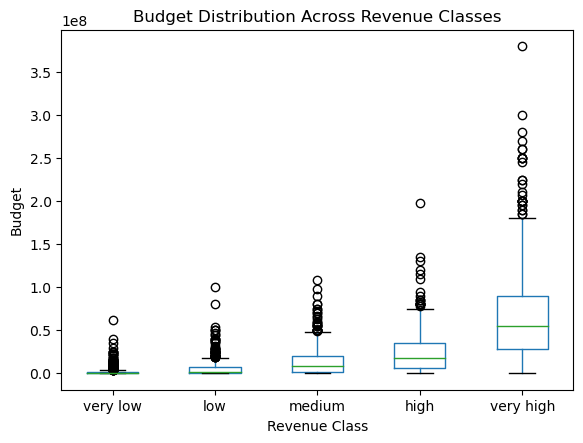

In [10]:
data.boxplot(by='revenue_class', column=['budget'], grid=False)
plt.xticks(ticks=range(1, 6), labels=custom_order)
plt.xlabel('Revenue Class')
plt.ylabel('Budget')
plt.title('Budget Distribution Across Revenue Classes')
plt.suptitle('')
plt.show()

In [11]:
#set data['belongs_to_collection'] to collection name if it is not null
for i in data.index:
    if not pd.isnull(data['belongs_to_collection'][i]):
        if "'name': '" in data['belongs_to_collection'][i]:
            data['belongs_to_collection'][i] = data['belongs_to_collection'][i].split("'name': '")[1].split("'")[0]
        elif '"name": "' in data['belongs_to_collection'][i]:
            data['belongs_to_collection'][i] = data['belongs_to_collection'][i].split('"name": "')[1].split('"')[0]
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1173140269.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['belongs_to_collection'][i] = data['belongs_to_collection'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1173140269.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['belongs_to_collection'][i] = data['belongs_to_collection'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1173140269.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentat

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,runtime,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue,revenue_class
0,1,Hot Tub Time Machine Collection,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,93.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2
1,2,The Princess Diaries Collection,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,113.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4
2,3,NaN,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,105.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2
3,4,NaN,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,122.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2
4,5,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,118.0,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1


In [12]:
data['Collection_Name'] = data['belongs_to_collection']
data['belongs_to_collection'] = [0 if pd.isnull(i) else 1 for i in data['belongs_to_collection']]
data.head()

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,spoken_languages,status,tagline,title,Keywords,cast,crew,revenue,revenue_class,Collection_Name
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2,Hot Tub Time Machine Collection
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4,The Princess Diaries Collection
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2,NaN
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2,NaN
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,"[{'iso_639_1': 'ko', 'name': '한국어/조선말'}]",Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1,NaN


<Axes: xlabel='belongs_to_collection'>

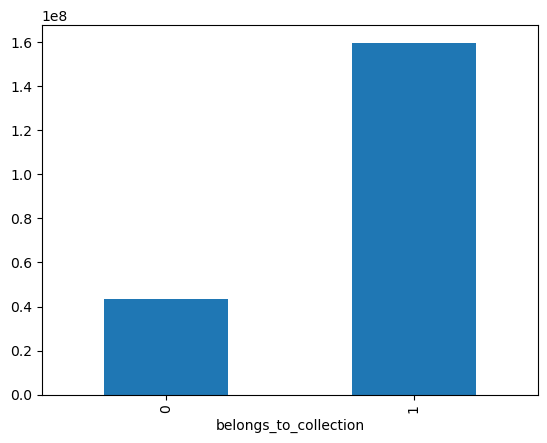

In [13]:
#show average revenue for collections and movies not in collections
data.groupby('belongs_to_collection')['revenue'].mean().plot(kind='bar')

In [14]:
#extract main genre from data['genres']
data['main_genre'] = data['genres']
for i in data.index:
    if not pd.isnull(data['main_genre'][i]):
        data['main_genre'][i] = data['main_genre'][i].split("'name': '")[1].split("'")[0]
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1972124186.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['main_genre'][i] = data['main_genre'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1972124186.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['main_genre'][i] = data['main_genre'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\1972124186.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,status,tagline,title,Keywords,cast,crew,revenue,revenue_class,Collection_Name,main_genre
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,Released,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2,Hot Tub Time Machine Collection,Comedy
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,Released,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4,The Princess Diaries Collection,Comedy
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,Released,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2,NaN,Drama
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,Released,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2,NaN,Thriller
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,Released,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1,NaN,Action


<Axes: xlabel='main_genre'>

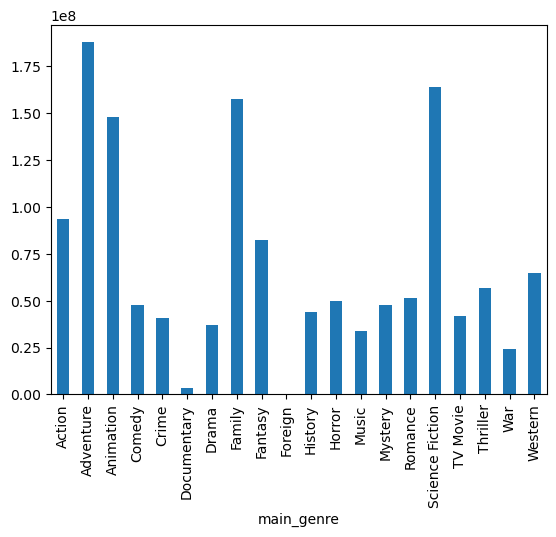

In [15]:
#show average revenue for each genre
data.groupby('main_genre')['revenue'].mean().plot(kind='bar')

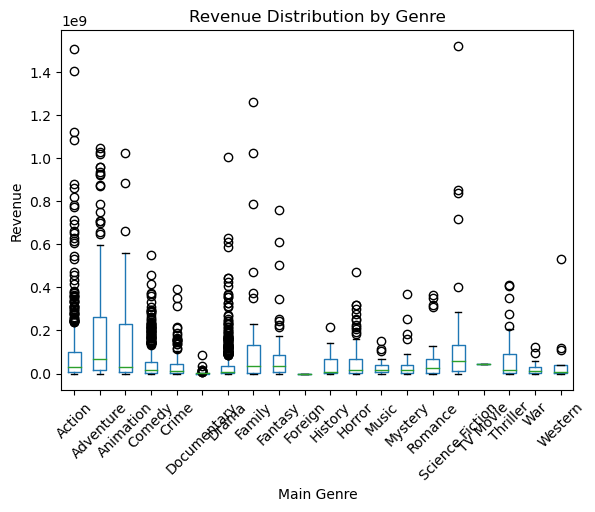

In [16]:
data.boxplot(by='main_genre', column=['revenue'], grid=False)
plt.xlabel('Main Genre')
plt.ylabel('Revenue')
plt.title('Revenue Distribution by Genre')
plt.suptitle('')
plt.xticks(rotation=45)
plt.show()

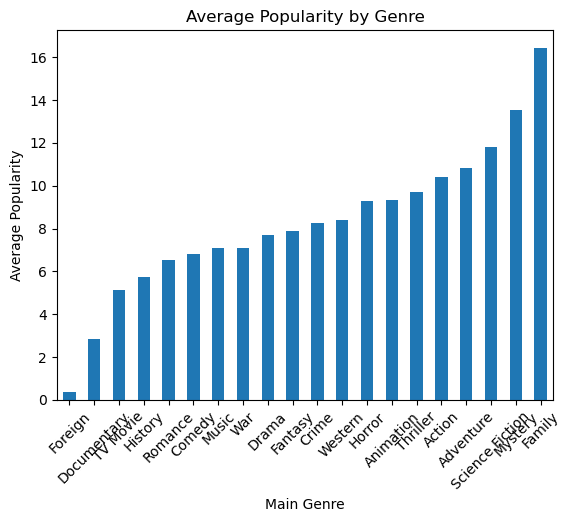

In [17]:
genre_popularity = data.groupby('main_genre')['popularity'].mean().sort_values()
genre_popularity.plot(kind='bar')
plt.xlabel('Main Genre')
plt.ylabel('Average Popularity')
plt.title('Average Popularity by Genre')
plt.xticks(rotation=45)
plt.show()

In [18]:
#add new column called production id
data['production_id'] = data['production_companies']
#set data['production_id'] to id in data['production_companies']
for i in data.index:
    if not pd.isnull(data['production_companies'][i]):
        data['production_id'][i] = data['production_companies'][i].split("'id': ")[1].split("}")[0]
#extract production companies from data['production_companies']
for i in data.index:
    if not pd.isnull(data['production_companies'][i]):
        if "'name': '" in data['production_companies'][i]:
            data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
        elif '"name": "' in data['production_companies'][i]:
            data['production_companies'][i] = data['production_companies'][i].split('"name": "')[1].split('"')[0]
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_id'][i] = data['production_companies'][i].split("'id': ")[1].split("}")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_id'][i] = data['production_companies'][i].split("'id': ")[1].split("}")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentati

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentati

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['production_companies'][i] = data['production_companies'][i].split("'name': '")[1].split("'")[0]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3300436389.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentati

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,tagline,title,Keywords,cast,crew,revenue,revenue_class,Collection_Name,main_genre,production_id
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,The Laws of Space and Time are About to be Vio...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2,Hot Tub Time Machine Collection,Comedy,4
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,It can take a lifetime to find true love; she'...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4,The Princess Diaries Collection,Comedy,2
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,The road to greatness can take you to the edge.,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2,NaN,Drama,2266
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,NaN,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2,NaN,Thriller,NaN
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,NaN,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1,NaN,Action,NaN


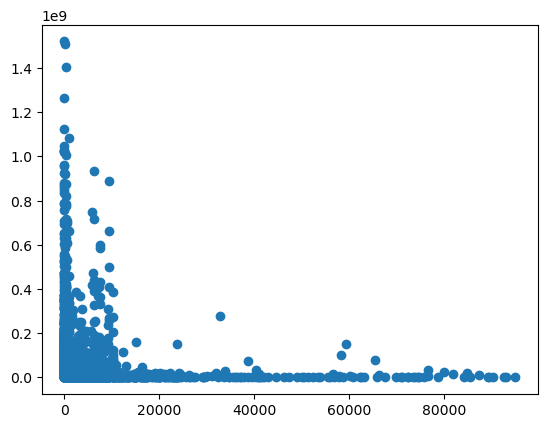

In [19]:
#plot by production id matplotlib scatter plot
data['production_id'] = pd.to_numeric(data['production_id'])
plt.scatter(data['production_id'], data['revenue'])
plt.show()


In [20]:
#add new column called big production company and set it to 1 if production company has more than 50 movies
data['big_production_company'] = 0
for i in data.index:
    if not pd.isnull(data['production_companies'][i]):
        if data['production_companies'][i] in data['production_companies'].value_counts().index[:50]:
            data['big_production_company'][i] = 1
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_company'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3738423525.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['big_production_com

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,title,Keywords,cast,crew,revenue,revenue_class,Collection_Name,main_genre,production_id,big_production_company
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,Hot Tub Time Machine 2,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2,Hot Tub Time Machine Collection,Comedy,4.0,1
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,The Princess Diaries 2: Royal Engagement,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4,The Princess Diaries Collection,Comedy,2.0,1
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,Whiplash,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2,NaN,Drama,2266.0,0
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,Kahaani,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2,NaN,Thriller,NaN,0
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,Marine Boy,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1,NaN,Action,NaN,0


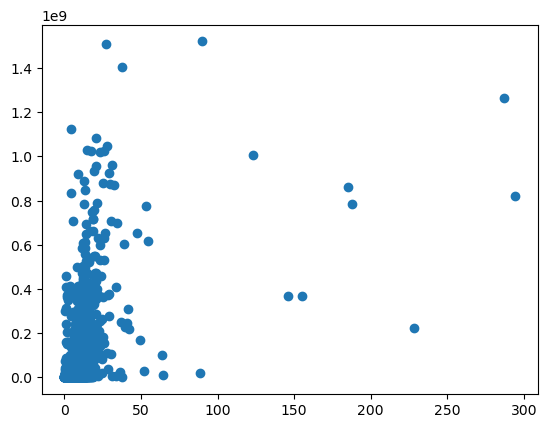

In [21]:
#scatter plot revenue and popularity
plt.scatter(data['popularity'], data['revenue'])
plt.show()

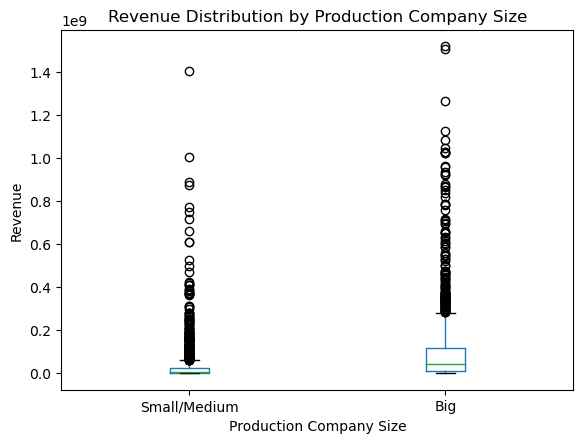

In [22]:
data.boxplot(by='big_production_company', column=['revenue'], grid=False)
plt.xlabel('Production Company Size')
plt.ylabel('Revenue')
plt.title('Revenue Distribution by Production Company Size')
plt.suptitle('')
plt.xticks(ticks=[1, 2], labels=['Small/Medium', 'Big'])
plt.show()

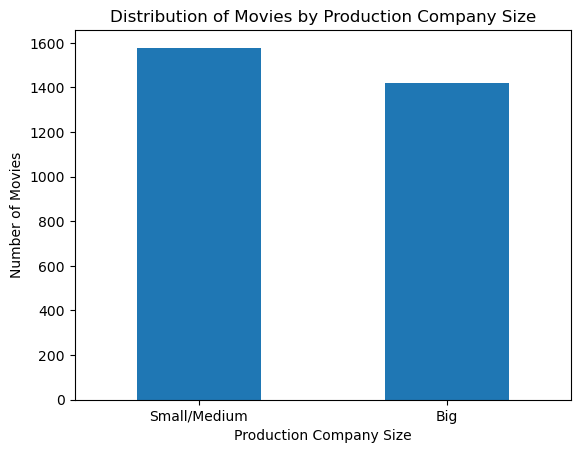

In [23]:
big_prod_company_counts = data['big_production_company'].value_counts()

big_prod_company_counts.plot(kind='bar')
plt.xlabel('Production Company Size')
plt.ylabel('Number of Movies')
plt.title('Distribution of Movies by Production Company Size')
plt.xticks(ticks=[0, 1], labels=['Small/Medium', 'Big'], rotation=0)
plt.show()

In [24]:
#add new column to data set to 1 if movie is in English and 0 if not
data['in_english'] = 0
for i in data.index:
    if data['original_language'][i] == 'en':
        data['in_english'][i] = 1
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\754310504.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['in_english'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\754310504.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['in_english'][i] = 1
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\754310504.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['in_english'][i] = 1
C:\Users\16154\AppData\Lo

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,Keywords,cast,crew,revenue,revenue_class,Collection_Name,main_genre,production_id,big_production_company,in_english
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,"[{'id': 4379, 'name': 'time travel'}, {'id': 9...","[{'cast_id': 4, 'character': 'Lou', 'credit_id...","[{'credit_id': '59ac067c92514107af02c8c8', 'de...",12314651,2,Hot Tub Time Machine Collection,Comedy,4.0,1,1
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,"[{'id': 2505, 'name': 'coronation'}, {'id': 42...","[{'cast_id': 1, 'character': 'Mia Thermopolis'...","[{'credit_id': '52fe43fe9251416c7502563d', 'de...",95149435,4,The Princess Diaries Collection,Comedy,2.0,1,1
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,"[{'id': 1416, 'name': 'jazz'}, {'id': 1523, 'n...","[{'cast_id': 5, 'character': 'Andrew Neimann',...","[{'credit_id': '54d5356ec3a3683ba0000039', 'de...",13092000,2,NaN,Drama,2266.0,0,1
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,"[{'id': 10092, 'name': 'mystery'}, {'id': 1054...","[{'cast_id': 1, 'character': 'Vidya Bagchi', '...","[{'credit_id': '52fe48779251416c9108d6eb', 'de...",16000000,2,NaN,Thriller,NaN,0,0
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,NaN,"[{'cast_id': 3, 'character': 'Chun-soo', 'cred...","[{'credit_id': '52fe464b9251416c75073b43', 'de...",3923970,1,NaN,Action,NaN,0,0


<Axes: xlabel='in_english'>

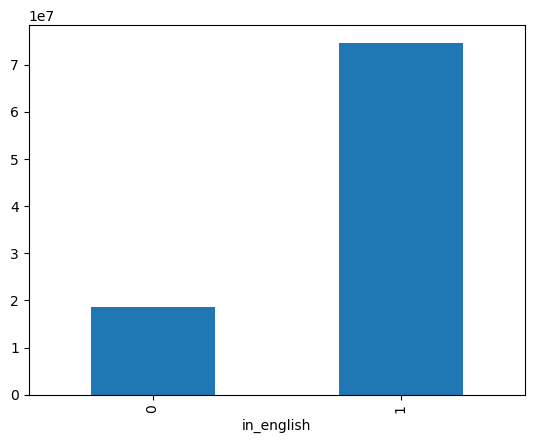

In [25]:
#plot average revenue for english and non-english movies
data.groupby('in_english')['revenue'].mean().plot(kind='bar')

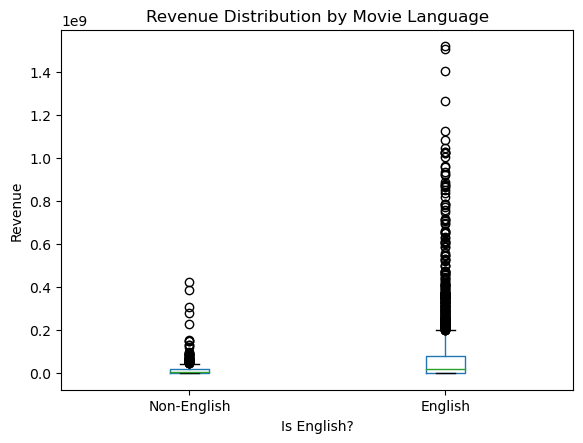

In [26]:
data.boxplot(by='in_english', column=['revenue'], grid=False)
plt.xlabel('Is English?')
plt.ylabel('Revenue')
plt.title('Revenue Distribution by Movie Language')
plt.suptitle('')
plt.xticks(ticks=[1, 2], labels=['Non-English', 'English'])
plt.show()

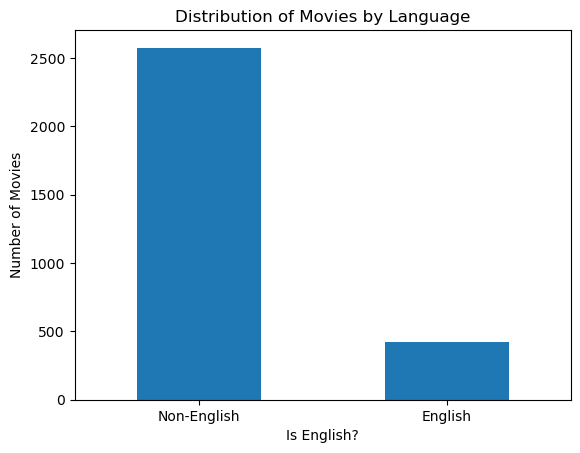

In [27]:
english_movie_counts = data['in_english'].value_counts()

english_movie_counts.plot(kind='bar')
plt.xlabel('Is English?')
plt.ylabel('Number of Movies')
plt.title('Distribution of Movies by Language')
plt.xticks(ticks=[0, 1], labels=['Non-English', 'English'], rotation=0)
plt.show()

In [28]:
#set release date to columns for year, month, and weekday
#make release date in 1900s if it is greater than 2019
for i in data.index:
    if int(data['release_date'][i][-2:]) > 19:
        data['release_date'][i] = data['release_date'][i][:-2] + '19' + data['release_date'][i][-2:]
    else:
        data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
data['release_date'] = pd.to_datetime(data['release_date'])
data['release_year'] = data['release_date'].dt.year.astype(int)
data['release_month'] = data['release_date'].dt.month.astype(int)
data['release_day'] = data['release_date'].dt.weekday.astype(int)
data.head()

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '19' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '20' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '19' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['release_date'][i] = data['release_date'][i][:-2] + '19' + data['release_date'][i][-2:]
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\4035949782.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

,id,belongs_to_collection,budget,genres,homepage,imdb_id,original_language,original_title,overview,popularity,...,revenue,revenue_class,Collection_Name,main_genre,production_id,big_production_company,in_english,release_year,release_month,release_day
0,1,1,14000000,"[{'id': 35, 'name': 'Comedy'}]",NaN,tt2637294,en,Hot Tub Time Machine 2,"When Lou, who has become the ""father of the In...",6.575393,...,12314651,2,Hot Tub Time Machine Collection,Comedy,4.0,1,1,2015,2,4
1,2,1,40000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,tt0368933,en,The Princess Diaries 2: Royal Engagement,Mia Thermopolis is now a college graduate and ...,8.248895,...,95149435,4,The Princess Diaries Collection,Comedy,2.0,1,1,2004,8,4
2,3,0,3300000,"[{'id': 18, 'name': 'Drama'}]",http://sonyclassics.com/whiplash/,tt2582802,en,Whiplash,"Under the direction of a ruthless instructor, ...",64.299990,...,13092000,2,NaN,Drama,2266.0,0,1,2014,10,4
3,4,0,1200000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",http://kahaanithefilm.com/,tt1821480,hi,Kahaani,Vidya Bagchi (Vidya Balan) arrives in Kolkata ...,3.174936,...,16000000,2,NaN,Thriller,NaN,0,0,2012,3,4
4,5,0,0,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,tt1380152,ko,마린보이,Marine Boy is the story of a former national s...,1.148070,...,3923970,1,NaN,Action,NaN,0,0,2009,2,3


<Axes: xlabel='release_month'>

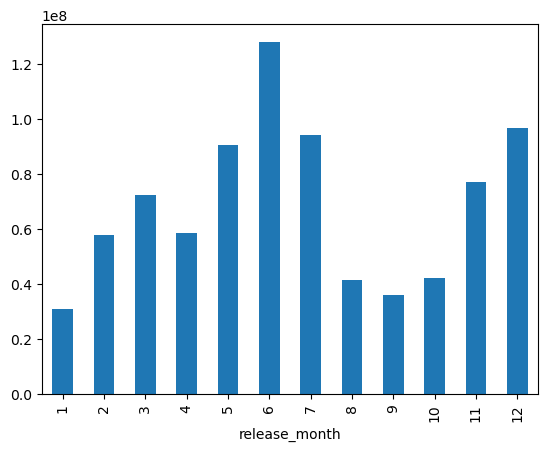

In [29]:
#plot average revenue for each month, year, and weekday
data.groupby('release_month')['revenue'].mean().plot(kind='bar')

<Axes: xlabel='release_day'>

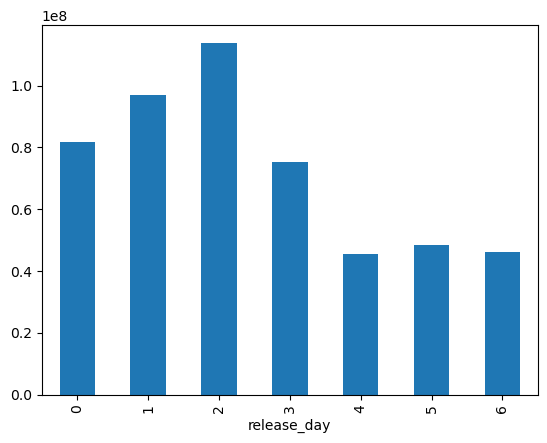

In [30]:
data.groupby('release_day')['revenue'].mean().plot(kind='bar')

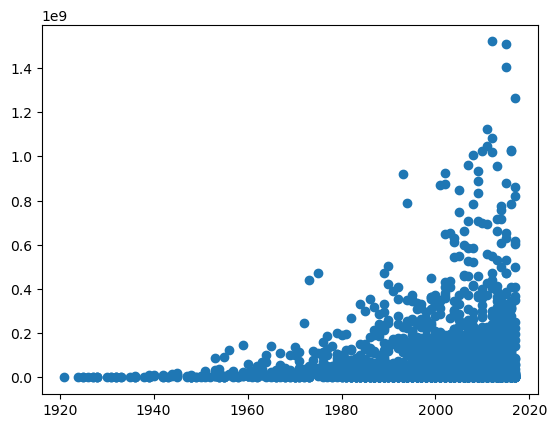

In [31]:
#plot average revenue for each year matplotlib scatter plot
plt.scatter(data['release_year'], data['revenue'])
plt.show()

<Axes: xlabel='tagline_exists'>

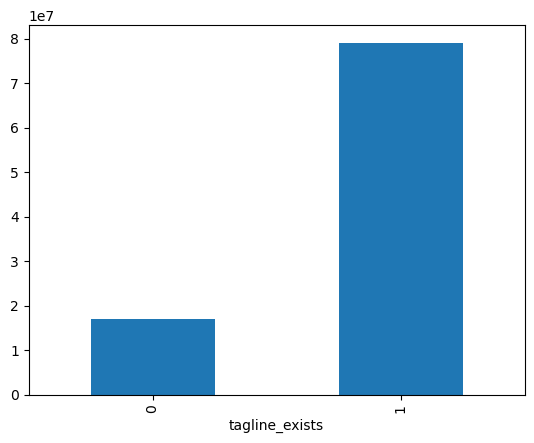

In [32]:
#adding column for if tagline exists
data['tagline_exists'] = [0 if pd.isnull(i) else 1 for i in data['tagline']]
data.head()
data.groupby('tagline_exists')['revenue'].mean().plot(kind='bar')

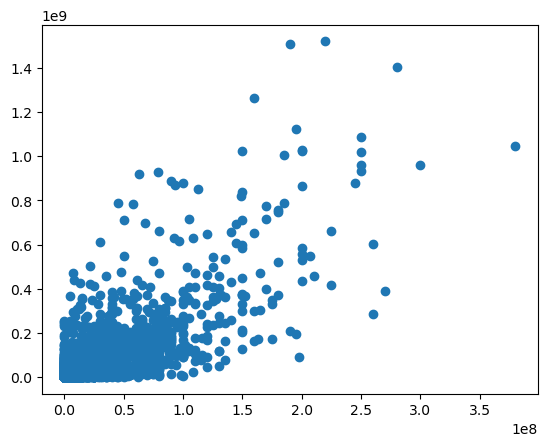

In [33]:
#plot scatter plot of budget and revenue
plt.scatter(data['budget'], data['revenue'])
plt.show()

<Axes: xlabel='homepage_exists'>

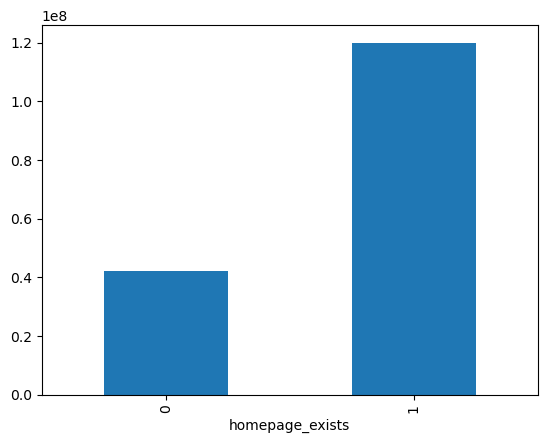

In [34]:
#adding column for if tagline exists
data['homepage_exists'] = [0 if pd.isnull(i) else 1 for i in data['homepage']]
data.groupby('homepage_exists')['revenue'].mean().plot(kind='bar')

<Axes: xlabel='poster_exists'>

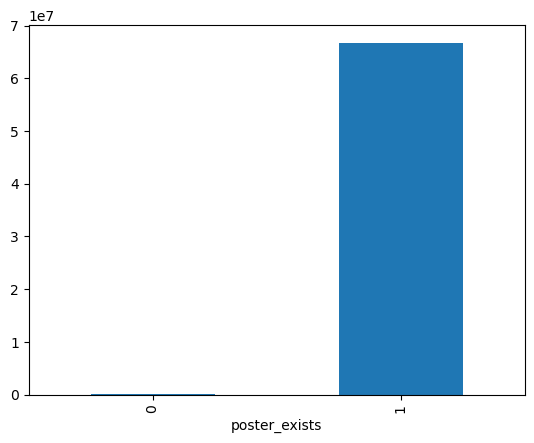

In [35]:
#adding column for if tagline exists
data['poster_exists'] = [0 if pd.isnull(i) else 1 for i in data['poster_path']]
data.groupby('poster_exists')['revenue'].mean().plot(kind='bar')

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\2910084695.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_crew'][i] = len(data['crew'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\2910084695.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_cast'][i] = len(data['cast'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\2910084695.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

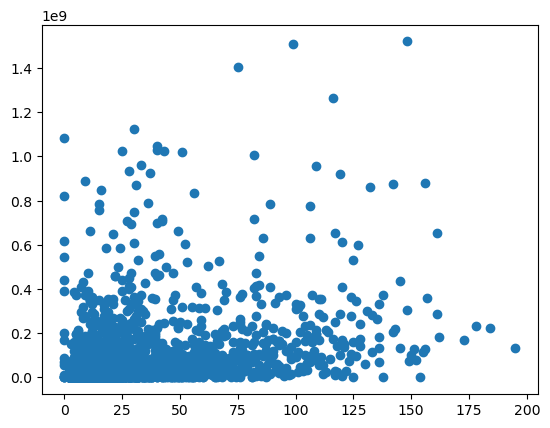

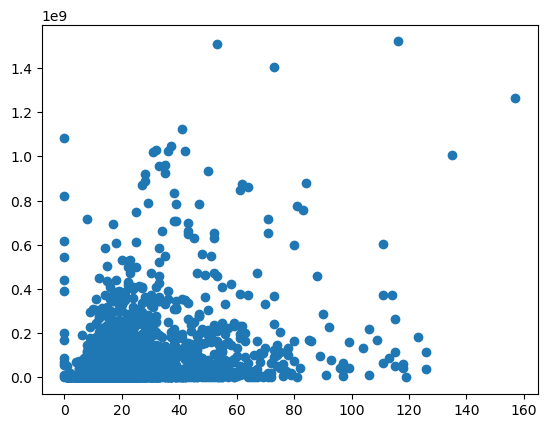

In [36]:
#add column for number of crew and cast in movie
data['num_crew'] = 0
data['num_cast'] = 0
for i in data.index:
    if not pd.isnull(data['crew'][i]):
        data['num_crew'][i] = len(data['crew'][i].split('}'))
    if not pd.isnull(data['cast'][i]):
        data['num_cast'][i] = len(data['cast'][i].split('}'))
data.head()
#plot scatter plot of revenue for each number of crew and cast
plt.scatter(data['num_crew'], data['revenue'])
plt.show()
plt.scatter(data['num_cast'], data['revenue'])
plt.show()


Text(0.5, 1.0, 'Relationship Between Number of Cast and Revenue')

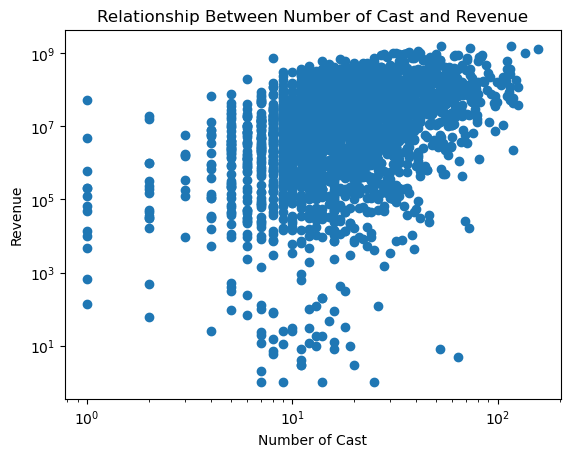

In [37]:
plt.scatter(data['num_cast'], data['revenue'])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Number of Cast')
plt.ylabel('Revenue')
plt.title('Relationship Between Number of Cast and Revenue')


C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['keyword_count'][i] = len(data['Keywords'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['keyword_count'][i] = len(data['Keywords'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['keyword_count'][i] = len(data['Keywords'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['keyword_count'][i] = len(data['Keywords'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\3732692422.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

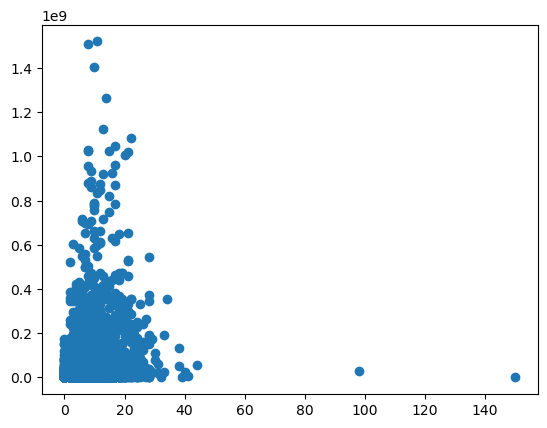

In [38]:
#add column for keyword count
data['keyword_count'] = 0
for i in data.index:
    if not pd.isnull(data['Keywords'][i]):
        data['keyword_count'][i] = len(data['Keywords'][i].split('}'))
#plot scatter plot of revenue for each number of keywords
plt.scatter(data['keyword_count'], data['revenue'])
plt.show()

Text(0.5, 1.0, 'Relationship Between Keyword Count and Revenue')

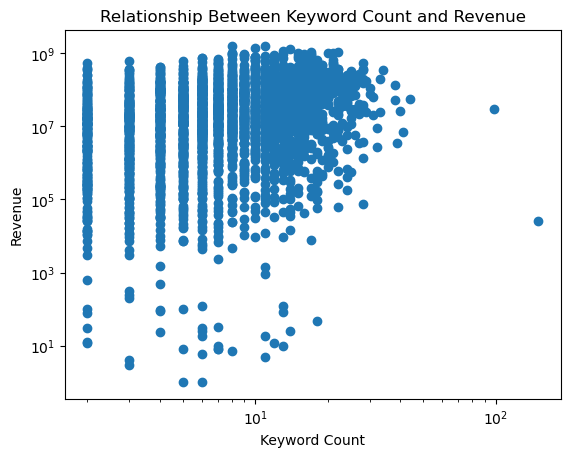

In [39]:
plt.scatter(data['keyword_count'], data['revenue'])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Keyword Count')
plt.ylabel('Revenue')
plt.title('Relationship Between Keyword Count and Revenue')

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_genres'][i] = len(data['genres'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_genres'][i] = len(data['genres'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_genres'][i] = len(data['genres'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['num_genres'][i] = len(data['genres'][i].split('}'))
C:\Users\16154\AppData\Local\Temp\ipykernel_12456\302766501.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

<Axes: xlabel='num_genres'>

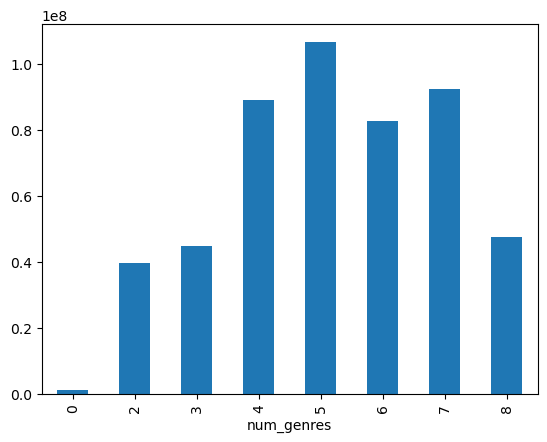

In [40]:
#add column for number of genres
data['num_genres'] = 0
for i in data.index:
    if not pd.isnull(data['genres'][i]):
        data['num_genres'][i] = len(data['genres'][i].split('}'))
#plot average revenue for each number of genres
data.groupby('num_genres')['revenue'].mean().plot(kind='bar')

In [42]:
print(data.columns)

Index(['id', 'belongs_to_collection', 'budget', 'genres', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'runtime', 'spoken_languages',
       'status', 'tagline', 'title', 'Keywords', 'cast', 'crew', 'revenue',
       'revenue_class', 'Collection_Name', 'main_genre', 'production_id',
       'big_production_company', 'in_english', 'release_year', 'release_month',
       'release_day', 'tagline_exists', 'homepage_exists', 'poster_exists',
       'num_crew', 'num_cast', 'keyword_count', 'num_genres'],
      dtype='object')


In [43]:
for i in data.columns:
    if data[i].dtype == 'int64' or data[i].dtype == 'float64':
        data[i] = data[i].fillna(data[i].mean())
    else:
        data[i] = data[i].fillna(data[i].mode()[0])


In [134]:
#fit linear regression model to predict revenue from budget
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, BayesianRidge, LassoLars
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

X = data[['belongs_to_collection', 'budget', 'production_id',
       'big_production_company', 'in_english', 'release_year', 'release_month',
       'release_day', 'tagline_exists', 'homepage_exists', 'poster_exists',
       'num_crew', 'num_cast', 'keyword_count', 'num_genres', 'popularity']]
y = data['revenue']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Squared Error: {mae}')
print(f'Model Accuracy: {model.score(X_test, y_test)}')

Mean Squared Error: 37383227.46275
Model Accuracy: 0.6776282539379053


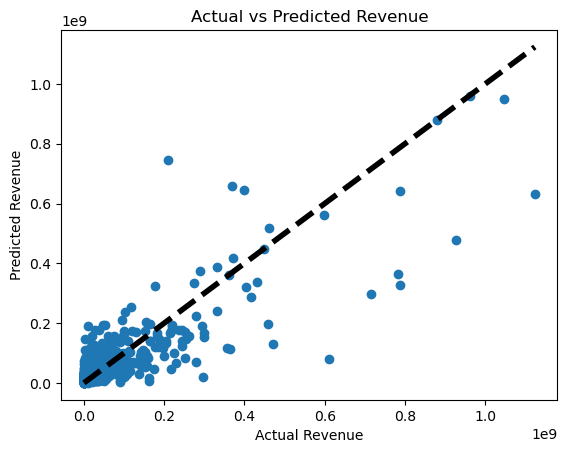

In [45]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Revenue')
plt.ylabel('Predicted Revenue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
plt.title('Actual vs Predicted Revenue')
plt.show()

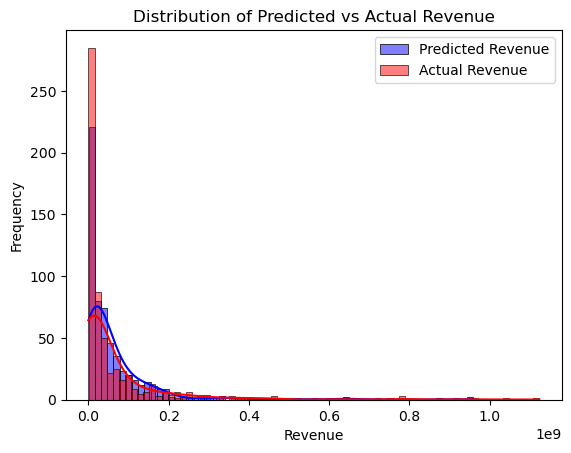

In [46]:
import seaborn as sns

sns.histplot(y_pred, color="blue", label="Predicted Revenue", kde=True)
sns.histplot(y_test, color="red", label="Actual Revenue", kde=True)
plt.xlabel('Revenue')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted vs Actual Revenue')
plt.legend()
plt.show()

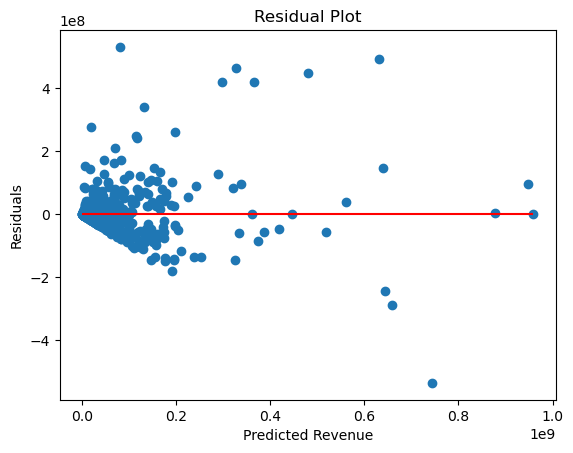

In [47]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.hlines(y=0, xmin=y_pred.min(), xmax=y_pred.max(), colors='red')
plt.xlabel('Predicted Revenue')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

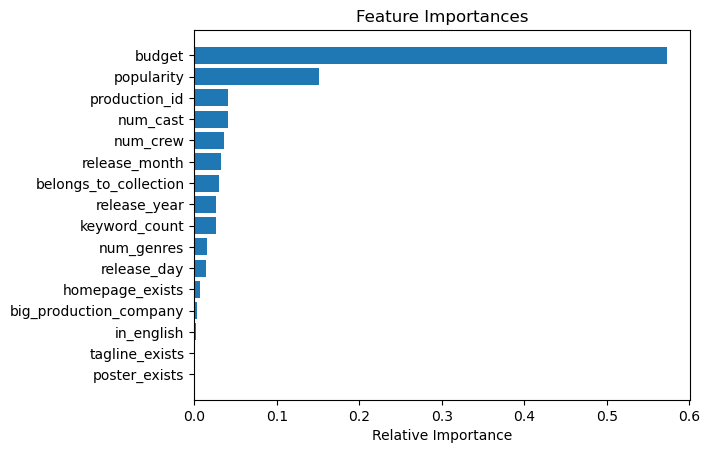

In [48]:
importances = model.feature_importances_
indices = np.argsort(importances)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [X.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [135]:
#backward feature selection
curr_score = model.score(X_test, y_test)
print(f'Previous Model Score: {curr_score}')
deselected_cols = []
for d in range(len(np.array(X_train)[0])):
    new_X_train = np.delete(np.array(X_train), d, 1)
    new_X_test = np.delete(np.array(X_test), d, 1)
    model.fit(new_X_train, y_train)
    y_pred = model.predict(new_X_test)
    print(f'Model Accuracy without feature {d} : {model.score(new_X_test, np.array(y_test))}')
    if curr_score - model.score(new_X_test, np.array(y_test)) < 0.001:
        deselected_cols.append(d)
print(f'Omitted Features: {deselected_cols}')

Previous Model Score: 0.6776282539379053
Model Accuracy without feature 0 : 0.6640963933731299
Model Accuracy without feature 1 : 0.5660156380416237
Model Accuracy without feature 2 : 0.6851560143894073
Model Accuracy without feature 3 : 0.6826451801523452
Model Accuracy without feature 4 : 0.7045123089177009
Model Accuracy without feature 5 : 0.6745110958881348
Model Accuracy without feature 6 : 0.6963984343310003
Model Accuracy without feature 7 : 0.6828308170108564
Model Accuracy without feature 8 : 0.6756131606855398
Model Accuracy without feature 9 : 0.6912456324047669
Model Accuracy without feature 10 : 0.6842260295892735
Model Accuracy without feature 11 : 0.6991772764751428
Model Accuracy without feature 12 : 0.7132160865164279
Model Accuracy without feature 13 : 0.6796425097129561
Model Accuracy without feature 14 : 0.694151814697435
Model Accuracy without feature 15 : 0.6513845537481538
Omitted Features: [2, 3, 4, 6, 7, 9, 10, 11, 12, 13, 14]


In [136]:
model = RandomForestRegressor()
model.fit(np.delete(X_train, deselected_cols, 1), y_train)
y_pred = model.predict(np.delete(X_test, deselected_cols, 1))
mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Squared Error: {mae}')
print(f'Model Accuracy: {model.score(np.delete(X_test, deselected_cols, 1), y_test)}')

Mean Squared Error: 37774064.746533334
Model Accuracy: 0.6962053635289822


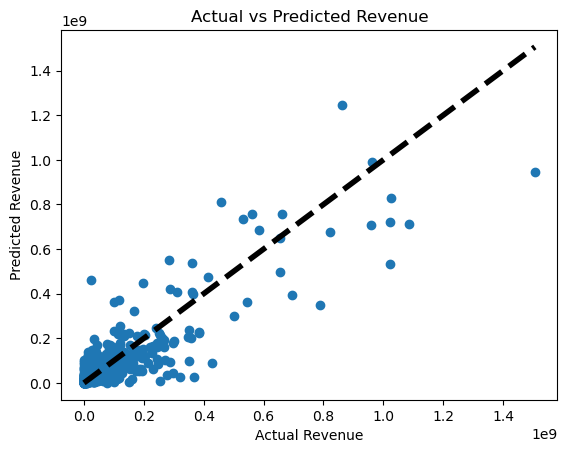

In [98]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Revenue')
plt.ylabel('Predicted Revenue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
plt.title('Actual vs Predicted Revenue')
plt.show()

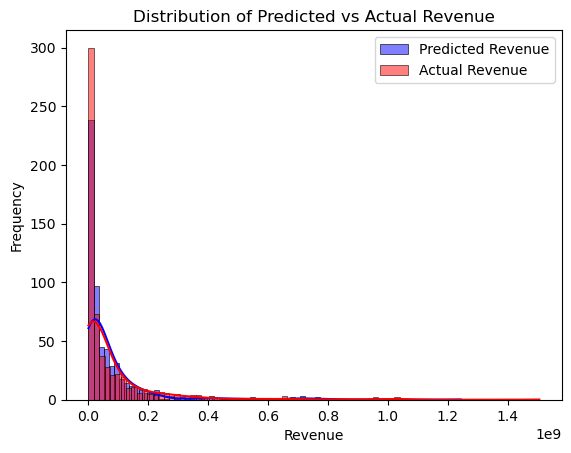

In [99]:
sns.histplot(y_pred, color="blue", label="Predicted Revenue", kde=True)
sns.histplot(y_test, color="red", label="Actual Revenue", kde=True)
plt.xlabel('Revenue')
plt.ylabel('Frequency')
plt.title('Distribution of Predicted vs Actual Revenue')
plt.legend()
plt.show()

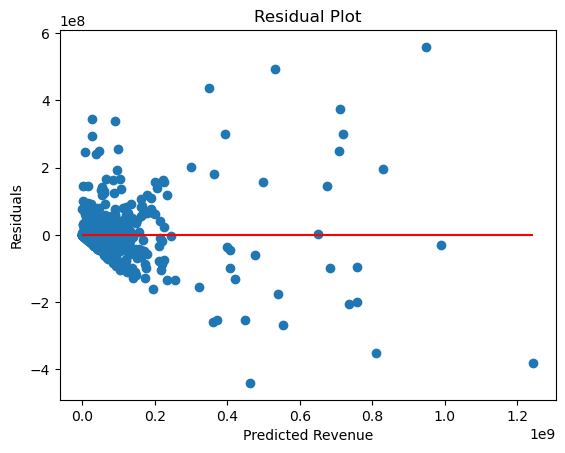

In [100]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.hlines(y=0, xmin=y_pred.min(), xmax=y_pred.max(), colors='red')
plt.xlabel('Predicted Revenue')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

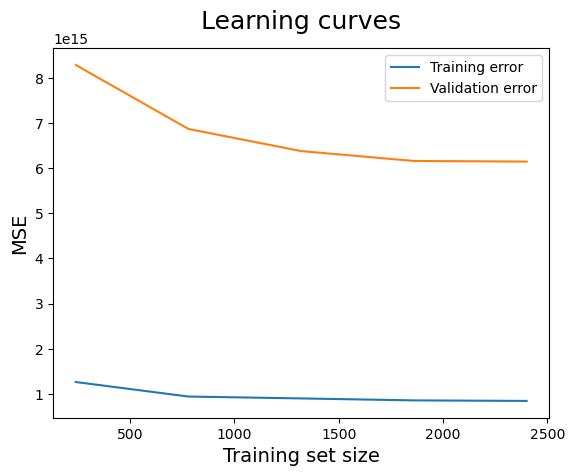

In [48]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, validation_scores = learning_curve(
    model, X, y, train_sizes=np.linspace(0.1, 1.0, 5), cv=5, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
validation_scores_mean = -validation_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, validation_scores_mean, label='Validation error')
plt.ylabel('MSE', fontsize=14)
plt.xlabel('Training set size', fontsize=14)
plt.title('Learning curves', fontsize=18, y=1.03)
plt.legend()
plt.show()